Understanding the global health landscape allows companies to make informed decisions about resource allocation, business expansion, and partnerships.
Pharmaceutical companies may consider increasing investments in global health initiatives, including programs that aim to improve access to healthcare,vaccinations, and essential medications in developing countries. This not only aligns with corporate social responsibility but can also have positive business implications.

In [1]:
!pip install opendatasets
import opendatasets as od
import os
import pandas as pd

In [2]:
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

In [3]:
import opendatasets as od

dataset = 'https://www.kaggle.com/datasets/mryasirturi/life-expentancy-dataset'
od.download(dataset, force=True)

import os

data_dir = './life-expentancy-dataset' 
os.listdir(data_dir)

import pandas as pd

# Check the exact file names in the directory
file_names = os.listdir(data_dir)
print(file_names)


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: meenudsaini
Your Kaggle Key: ········


100%|██████████| 120k/120k [00:00<00:00, 462kB/s]


['app.py', 'final_project.pbit', 'Life Expectancy Data - Copy.csv', 'Life Expectancy Data.csv']


In [40]:
# Assuming the file name has spaces, use quotes around the file name
file_path = os.path.join(data_dir, 'Life Expectancy Data.csv')

# Read the CSV file
df = pd.read_csv(file_path)
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [42]:
df.rename(columns={" BMI ":"BMI","Life expectancy ":"Life_Expectancy","Adult Mortality":"Adult_Mortality",
                   "infant deaths":"Infant_Deaths","percentage expenditure":"Percentage_Exp","Hepatitis B":"HepatitisB",
                  "Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths","Diphtheria ":"Diphtheria",
                  " HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_1to19_years"," thinness 5-9 years":"thinness_5to9_years","Income composition of resources":"Income_Comp_Of_Resources",
                   "Total expenditure":"Tot_Exp"},inplace=True)

In [43]:
df.head()

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,...,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [44]:
#Calculate the ratio of missing rows to total rows
df.isna().sum().sort_values(ascending=False)*100/len(df)

Population                  22.191967
HepatitisB                  18.822328
GDP                         15.248468
Tot_Exp                      7.692308
Alcohol                      6.603131
Income_Comp_Of_Resources     5.684139
Schooling                    5.547992
thinness_5to9_years          1.157250
thinness_1to19_years         1.157250
BMI                          1.157250
Polio                        0.646698
Diphtheria                   0.646698
Life_Expectancy              0.340368
Adult_Mortality              0.340368
HIV/AIDS                     0.000000
Country                      0.000000
Year                         0.000000
Measles                      0.000000
Percentage_Exp               0.000000
Infant_Deaths                0.000000
Status                       0.000000
Under_Five_Deaths            0.000000
dtype: float64

In [45]:
df.isna().sum()

Country                       0
Year                          0
Status                        0
Life_Expectancy              10
Adult_Mortality              10
Infant_Deaths                 0
Alcohol                     194
Percentage_Exp                0
HepatitisB                  553
Measles                       0
BMI                          34
Under_Five_Deaths             0
Polio                        19
Tot_Exp                     226
Diphtheria                   19
HIV/AIDS                      0
GDP                         448
Population                  652
thinness_1to19_years         34
thinness_5to9_years          34
Income_Comp_Of_Resources    167
Schooling                   163
dtype: int64

In [46]:
# handle null values using interpolation.
df_fixed = df.interpolate(method='ffill' ,inplace=False)
df_fixed.head()

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,...,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [47]:
df_fixed.isna().sum()

Country                     0
Year                        0
Status                      0
Life_Expectancy             0
Adult_Mortality             0
Infant_Deaths               0
Alcohol                     0
Percentage_Exp              0
HepatitisB                  0
Measles                     0
BMI                         0
Under_Five_Deaths           0
Polio                       0
Tot_Exp                     0
Diphtheria                  0
HIV/AIDS                    0
GDP                         0
Population                  0
thinness_1to19_years        0
thinness_5to9_years         0
Income_Comp_Of_Resources    0
Schooling                   0
dtype: int64

In [48]:
df_fixed.head()

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,...,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [49]:
df_fixed.Status.unique()

array(['Developing', 'Developed'], dtype=object)

In [50]:
df_fixed.Country.value_counts()

Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: Country, Length: 193, dtype: int64

In [51]:
df_fixed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   2938 non-null   object 
 1   Year                      2938 non-null   int64  
 2   Status                    2938 non-null   object 
 3   Life_Expectancy           2938 non-null   float64
 4   Adult_Mortality           2938 non-null   float64
 5   Infant_Deaths             2938 non-null   int64  
 6   Alcohol                   2938 non-null   float64
 7   Percentage_Exp            2938 non-null   float64
 8   HepatitisB                2938 non-null   float64
 9   Measles                   2938 non-null   int64  
 10  BMI                       2938 non-null   float64
 11  Under_Five_Deaths         2938 non-null   int64  
 12  Polio                     2938 non-null   float64
 13  Tot_Exp                   2938 non-null   float64
 14  Diphther

In [52]:
df_fixed.Year.unique()

array([2015, 2014, 2013, 2012, 2011, 2010, 2009, 2008, 2007, 2006, 2005,
       2004, 2003, 2002, 2001, 2000], dtype=int64)

In [53]:
df_fixed.Country.value_counts()

Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: Country, Length: 193, dtype: int64

In [54]:
top_ten_countries = df_fixed[['Country','Status']].value_counts().nlargest(10).index
top_ten_countries

MultiIndex([(     'Afghanistan', 'Developing'),
            (            'Peru', 'Developing'),
            (       'Nicaragua', 'Developing'),
            (           'Niger', 'Developing'),
            (         'Nigeria', 'Developing'),
            (          'Norway',  'Developed'),
            (            'Oman', 'Developing'),
            (        'Pakistan', 'Developing'),
            (          'Panama', 'Developing'),
            ('Papua New Guinea', 'Developing')],
           names=['Country', 'Status'])

In [55]:
top_ten_developed_countries = df_fixed[df_fixed['Status'] == 'Developed']['Country'].value_counts().nlargest(10).index
top_ten_developed_countries

Index(['Australia', 'Austria',
       'United Kingdom of Great Britain and Northern Ireland', 'Switzerland',
       'Sweden', 'Spain', 'Slovenia', 'Slovakia', 'Singapore', 'Romania'],
      dtype='object')

In [56]:
top_ten_developing_countries = df_fixed[df_fixed['Status'] == 'Developing']['Country'].value_counts().nlargest(10).index
top_ten_developing_countries

Index(['Afghanistan', 'Paraguay', 'Nicaragua', 'Niger', 'Nigeria', 'Oman',
       'Pakistan', 'Panama', 'Papua New Guinea', 'Peru'],
      dtype='object')

In [57]:
# Convert categorical variables to the appropriate data type
#df_fixed['Country'] = df_fixed['Country'].astype('category')
#df_fixed['Status'] = df_fixed['Status'].astype('category')

In [58]:
# Convert year to datetime type
#df_fixed['Year'] = pd.to_datetime(df_fixed['Year'], format='%Y')

In [59]:
df_fixed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   2938 non-null   object 
 1   Year                      2938 non-null   int64  
 2   Status                    2938 non-null   object 
 3   Life_Expectancy           2938 non-null   float64
 4   Adult_Mortality           2938 non-null   float64
 5   Infant_Deaths             2938 non-null   int64  
 6   Alcohol                   2938 non-null   float64
 7   Percentage_Exp            2938 non-null   float64
 8   HepatitisB                2938 non-null   float64
 9   Measles                   2938 non-null   int64  
 10  BMI                       2938 non-null   float64
 11  Under_Five_Deaths         2938 non-null   int64  
 12  Polio                     2938 non-null   float64
 13  Tot_Exp                   2938 non-null   float64
 14  Diphther

In [60]:
df_fixed.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.195643,164.816542,30.303948,4.607270,738.251295,75.683799,2419.592240,38.020150,42.035739,82.307692,5.905211,82.075221,1.742103,7475.593613,1.316870e+07,4.955956,5.002553,0.631418,11.935671
std,4.613841,9.536654,124.433748,117.926501,4.044785,1987.914858,28.851806,11467.272489,20.175077,160.445548,23.636677,2.484620,23.917022,5.077785,13728.461983,5.629984e+07,4.541403,4.670154,0.210920,3.340202
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.025000,74.000000,0.000000,0.880000,4.685343,66.000000,0.000000,19.000000,0.000000,77.000000,4.260000,78.000000,0.100000,456.766527,1.364255e+05,1.600000,1.600000,0.494000,10.100000
50%,2008.000000,72.000000,144.000000,3.000000,3.765000,64.912906,89.000000,17.000000,43.000000,4.000000,93.000000,5.710000,93.000000,0.100000,1680.834893,1.289898e+06,3.400000,3.400000,0.684000,12.300000
75%,2012.000000,75.600000,228.000000,22.000000,7.665000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.440000,97.000000,0.800000,6454.061607,7.394106e+06,7.300000,7.300000,0.791000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [61]:
#df_fixed.to_csv('df_fixed.csv', index=False)

# Hypotheses Testing

1.To Assess the Impact of Country Development Status on Life Expectancy:

Null Hypothesis (H0): There is no significant difference in life expectancy between developed and developing countries.
Alternative Hypothesis (H1): There is significant difference in life expectancy between developed and developing countries.

In [62]:
from scipy.stats import ttest_ind

# Subset the data into two groups based on 'Status' in the cleaned DataFrame
developed_countries = df_fixed[df_fixed['Status'] == 'Developed']['Life_Expectancy']
developing_countries = df_fixed[df_fixed['Status'] == 'Developing']['Life_Expectancy']

# Perform independent samples t-test
t_statistic, p_value = ttest_ind(developed_countries, developing_countries, equal_var=False)

# Print the results
print(f'T-statistic: {t_statistic}\nP-value: {p_value}')

# Interpretation
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in life expectancy between developed and developing countries.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in life expectancy between developed and developing countries.")

T-statistic: 47.99490164531862
P-value: 0.0
Reject the null hypothesis. There is a significant difference in life expectancy between developed and developing countries.


Observation: Significant difference in life expectancy between developed and developing countries indicates that developed countries spend more in improving their citizen's health including vaccination program as compared to developing countries.

2. Association between Education and Life Expectancy:

Null Hypothesis (H0): There is no significant association between Schooling and Life_Expectancy of Developed and Developing countries.
Alternative Hypothesis (H1): There is significant association between Schooling and Life_Expectancy of Developed and Developing countries.

In [63]:

developed_countries = df_fixed[df_fixed['Status'] == 'Developed'][['Schooling', 'Life_Expectancy']]
developing_countries = df_fixed[df_fixed['Status'] == 'Developing'][['Schooling', 'Life_Expectancy']]

# Correlation test for developed countries
correlation_developed, p_value_developed = pearsonr(developed_countries['Life_Expectancy'], developed_countries['Schooling'])
print(f'Correlation between Life_Expectancy and Schooling in Developed Countries: {correlation_developed}')
print(f'p-value: {p_value_developed}')

# Correlation test for developing countries
correlation_developing, p_value_developing = pearsonr(developing_countries['Life_Expectancy'], developing_countries['Schooling'])
print(f'Correlation between Life_Expectancy and Schooling in Developing Countries: {correlation_developing}')
print(f'p-value: {p_value_developing}')

Correlation between Life_Expectancy and Schooling in Developed Countries: 0.3469589951408766
p-value: 6.264015537103933e-16
Correlation between Life_Expectancy and Schooling in Developing Countries: 0.6769307068227293
p-value: 0.0


Observation: There is positive correlation between Schooling or we can say education with Life Expectancy 
of Developed and developing countries. Though in developed country it is moderate but in developing countries,it is highly correlated.
*If we look at the p-values, in case of Developed & developing countries it is extremly low than 0.05, so we can reject null hypotheses. We can say that there is strong evidence to claim that There is significant positive association between shooling(education) and Life_Expectancy of Developed & developing countries.


3. Association between Life Expectancy and Population:

Null Hypothesis (H0): There is no significant correlation between the life Expectancy and Population.
Alternative Hypothesis (H1): There is significant correlation between Life expectancy and Population.

In [65]:
developed_countries = df_fixed[df_fixed['Status'] == 'Developed'][['Life_Expectancy', 'Population']]
developing_countries = df_fixed[df_fixed['Status'] == 'Developing'][['Life_Expectancy', 'Population']]

# Correlation test for developed countries
correlation_developed, p_value_developed = pearsonr(developed_countries['Life_Expectancy'], developed_countries['Population'])
print(f'Correlation between Life_Expectancy and Population in Developed Countries: {correlation_developed}')
print(f'p-value: {p_value_developed}')

# Correlation test for developing countries
correlation_developing, p_value_developing = pearsonr(developing_countries['Life_Expectancy'], developing_countries['Population'])
print(f'Correlation between Life_Expectancy and Population in Developing Countries: {correlation_developing}')
print(f'p-value: {p_value_developing}')

Correlation between Life_Expectancy and Population in Developed Countries: 0.0857741356432408
p-value: 0.052418673111949816
Correlation between Life_Expectancy and Population in Developing Countries: 0.018641896243208483
p-value: 0.358722156921246


Observation: There is a weak positive correlation between Population and Life Expectancy in developed Country and very weak positive correlation in developing countries. But if we look at the p-value which are greater in both cases of developed and developing countries, so we can not reject null hypotheses testing. We can say that there no significant evidence that can claim correlation between life expectancy and population.

4. Impact of Alcohol on Life Expectancy:
    
Null Hypothesis (H0): There is no significant impact of Alcohol on life expectancy.
Alternative Hypothesis (H1): More Alcohol is associated with higher life expectancy.

In [66]:
developed_countries = df_fixed[df_fixed['Status'] == 'Developed'][['Life_Expectancy', 'Alcohol']]
developing_countries = df_fixed[df_fixed['Status'] == 'Developing'][['Life_Expectancy', 'Alcohol']]

# Correlation test for developed countries
correlation_developed, p_value_developed = pearsonr(developed_countries['Life_Expectancy'], developed_countries['Alcohol'])
print(f'Correlation between Life_Expectancy and Alcohol in Developed Countries: {correlation_developed}')
print(f'p-value: {p_value_developed}')

# Correlation test for developing countries
correlation_developing, p_value_developing = pearsonr(developing_countries['Life_Expectancy'], developing_countries['Alcohol'])
print(f'Correlation between Life_Expectancy and Alcohol in Developing Countries: {correlation_developing}')
print(f'p-value: {p_value_developing}')

Correlation between Life_Expectancy and Alcohol in Developed Countries: -0.2620681441068556
p-value: 1.733650540493782e-09
Correlation between Life_Expectancy and Alcohol in Developing Countries: 0.1869688774436492
p-value: 1.5973927112111375e-20


Observation: There is negative correlation between life expectancy and Alcohol consumption in developed countries. As p-value is extremely low, so we can reject null hypotheses. We can say that there is strong evidence to claim a significant negative impact of Alcohol consumption on life expectancy in developed countries. 

In case of developing countries, there is positive correlation and the extremely low p-value (much smaller than 0.05) suggests that you can reject the null hypothesis. There is strong evidence to claim a significant positive impact of alcohol on life expectancy in developing countries.

In simple terms we can say in Developed countries, More alcohol consumption is associated with lower life expectancy.
while in developing countries, More alcohol consumption is associated with higher life expectancy.

In [67]:
#Correlation Analysis

In [68]:
df_fixed_corr = df_fixed.corr(numeric_only=True)

<Axes: >

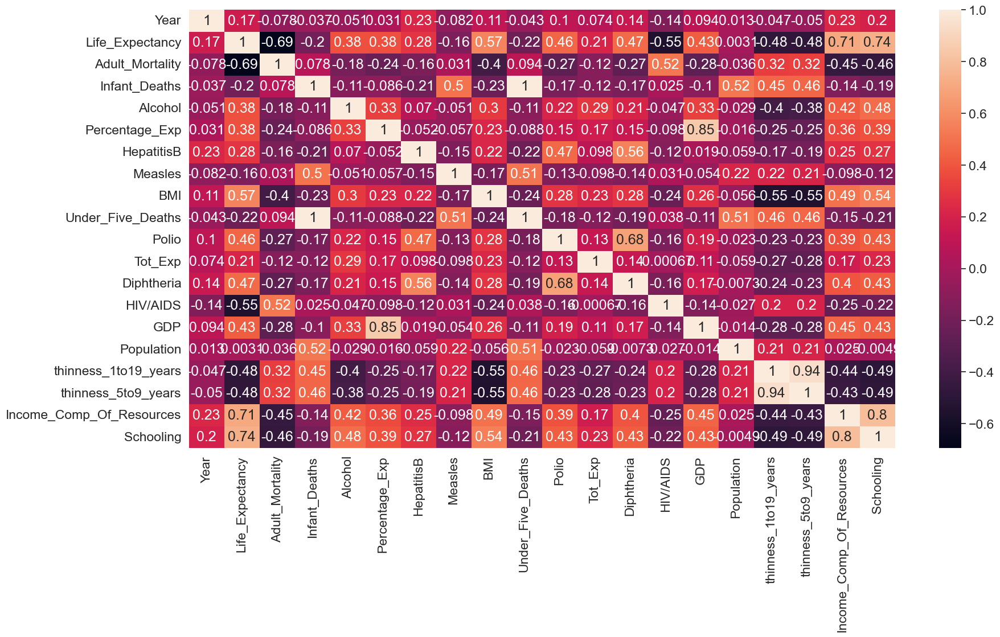

In [69]:
plt.figure(figsize=(20, 10))
sns.heatmap(df_fixed_corr, annot=True)

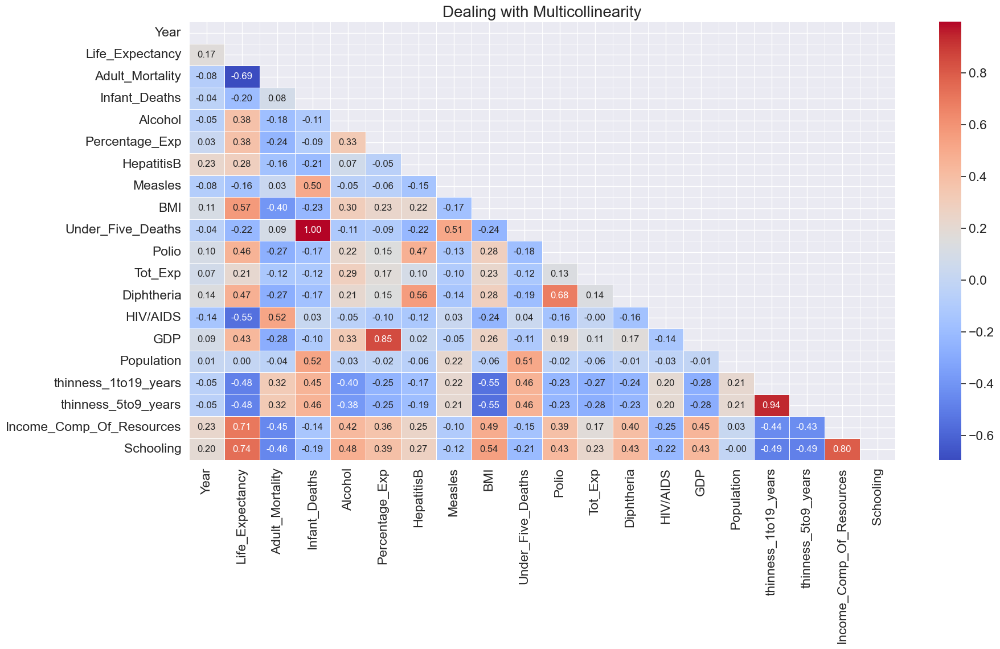

In [70]:
import plotly.express as px
mask = np.zeros_like(df_fixed_corr)
mask[np.triu_indices_from(mask)] = True # to hide half of the matrix
f, ax = plt.subplots(figsize=(20, 10))
sns.set(font_scale=1.5)
ax = sns.heatmap(df_fixed_corr, mask=mask, annot=True, annot_kws={"size": 12}, linewidths=.5, cmap='coolwarm', fmt=".2f", ax=ax)
ax.set_title("Dealing with Multicollinearity", fontsize=20)
plt.show()

In [71]:
# collinear features with respect to life expectancy: thinness_1to19_years(-0.48) & thinness_5to9_years(-0.48) are collinear
and polio(0.46) & Diptheria(0.47) v. closely related
alcohol(0.38) and percentage expenditure (0.38)are collinear

SyntaxError: invalid syntax (631174400.py, line 2)

# Data Visualization 

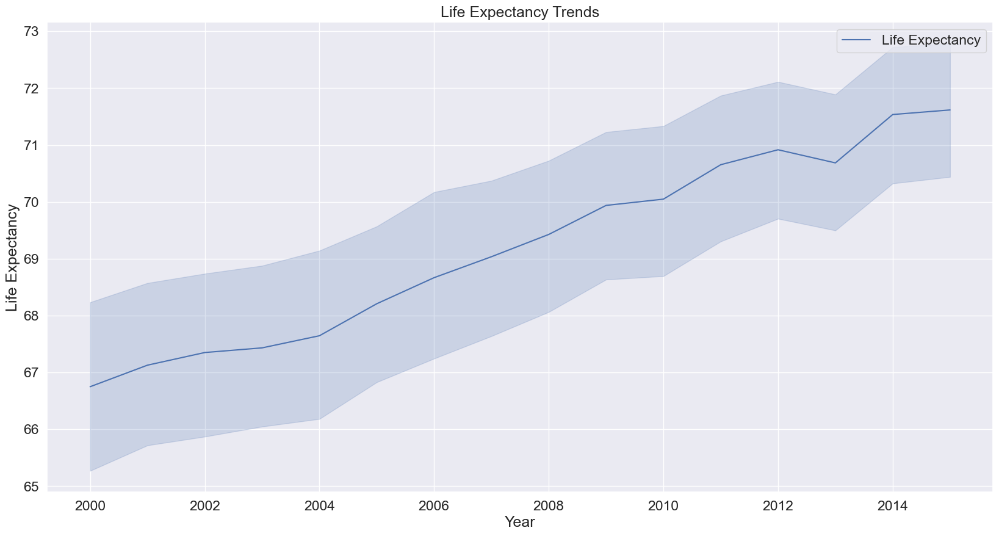

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 10))

# Assuming 'Life Expectancy' is the correct column name, adjust it if needed
sns.lineplot(data=df_fixed, x='Year', y='Life_Expectancy', label='Life Expectancy')

plt.xlabel('Year')
plt.ylabel('Life Expectancy')
plt.title('Life Expectancy Trends')
plt.legend()
plt.show()

In [73]:
fig=px.line(df_fixed.sort_values(by='Year'),x='Year',y='Life_Expectancy',animation_frame='Country',animation_group='Year',color='Country',markers=True,template='plotly_dark',title='<b> Countrywise Life Expectancy over Years')
fig.show()

In [74]:
fig=px.violin(df_fixed,x='Status',y='Life_Expectancy',color='Status',template='plotly_dark',box=True,title='Life expectancy Based on Countries status')
fig.show()

In [75]:
px.scatter(df_fixed.sort_values(by='Year'),y='Schooling',x='Life_Expectancy',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life_Expectancy',opacity=0.6,title='<b> Life expectancy versus Schooling of Countries in every Year')

In [76]:
px.scatter(df_fixed.sort_values(by='Year'),y='Population',x='Life_Expectancy',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life_Expectancy',opacity=0.6,title='<b> Life expectancy versus Population of Countries in every Year')

In [77]:
px.scatter(df_fixed.sort_values(by='Year'),y='Alcohol',x='Life_Expectancy',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life_Expectancy',opacity=0.6,title='<b> Life expectancy versus Alcohol of Countries in every Year')